### installations and imports

In [ ]:
!pip install -q rembg torchinfo grad-cam

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 10.8 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings("ignore")

import os
import shutil
from random import shuffle
from pathlib import Path
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from google.colab.patches import cv2_imshow
from rembg import remove
from rembg.session_factory import new_session

import torch
import torchvision
from torch.utils.data import DataLoader, random_split, default_collate
from torchvision.datasets import ImageFolder
from torchvision.transforms import *
from torchvision.utils import make_grid
import torchvision.transforms.functional as F
from torchvision.models import resnet50, resnet152, vit_l_16, vit_l_32, wide_resnet101_2, swin_b, swin_v2_s

from torchinfo import summary

from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, DeepFeatureFactorization, AblationCAM, ScoreCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image, deprocess_image, show_factorization_on_image

device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
!unzip -q "/content/drive/MyDrive/10Animals.zip"

In [ ]:
def split_dataset(source_dir, target_dir, test_size=0.2):
  """
  Splits the dataset in source_dir into train and test subsets, preserving class directories.

  Args:
    source_dir: Path to the directory containing subdirectories with images.
    target_dir: Path to the directory where the split datasets will be saved.
    test_size: Proportion of data to be allocated to the test set (default: 0.2).
  """
  class_dirs = [os.path.join(source_dir, d) for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]
  # Ensure target directory exists
  os.makedirs(target_dir, exist_ok=True)
  train_dir = os.path.join(target_dir, "train")
  test_dir = os.path.join(target_dir, "test")
  os.makedirs(train_dir, exist_ok=True)
  os.makedirs(test_dir, exist_ok=True)

  # Combine all images into a dictionary with class as key
  all_images = {}
  for class_dir in class_dirs:
    class_name = os.path.basename(class_dir)
    all_images[class_name] = []
    for filename in os.listdir(class_dir):
      if filename.lower().endswith(".jpeg") or filename.lower().endswith(".jpg") or filename.lower().endswith(".png"):
        all_images[class_name].append(os.path.join(class_dir, filename))

  # Split images in each class into train and test sets
  for class_name, images in all_images.items():
    shuffle(images)
    test_count = int(len(images) * test_size)
    train_images, test_images = images[:-test_count], images[-test_count:]


    # Create class subdirectories in train and test dirs
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

    # Copy images to respective class subdirectories
    for image_path in train_images:
      shutil.copy2(image_path, os.path.join(train_dir, class_name))
    for image_path in test_images:
      shutil.copy2(image_path, os.path.join(test_dir, class_name))

    print(f"Successfully split dataset. Train: {len(train_images)} images, Test: {len(test_images)} images.")

# Modify these paths according to your directory structure
source_dir = "/content/10Animals"  # Replace with your source directory path
target_dir = "/content/FinalImages"  # Replace with your target directory path (optional)

# Set test size (optional, defaults to 0.2)
test_size = 0.2

split_dataset(source_dir, target_dir, test_size)

Successfully split dataset. Train: 1456 images, Test: 364 images.
Successfully split dataset. Train: 2099 images, Test: 524 images.
Successfully split dataset. Train: 1335 images, Test: 333 images.
Successfully split dataset. Train: 1157 images, Test: 289 images.
Successfully split dataset. Train: 1690 images, Test: 422 images.
Successfully split dataset. Train: 1493 images, Test: 373 images.
Successfully split dataset. Train: 1490 images, Test: 372 images.
Successfully split dataset. Train: 3891 images, Test: 972 images.
Successfully split dataset. Train: 2479 images, Test: 619 images.
Successfully split dataset. Train: 3857 images, Test: 964 images.


In [ ]:
data = Path('/content/10Animals')

files = list(data.glob('**/*.jpeg'))

print(f"There are a total of {len(files)} number of images in the dataset")

There are a total of 24209 number of images in the dataset


### preprocessing techniques

###### background removal

Text(0.5, 1.0, 'Background removed')

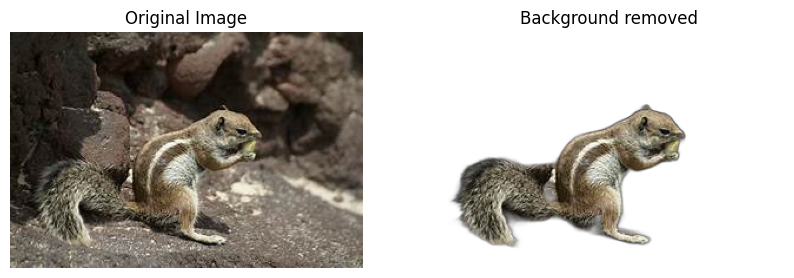

In [ ]:
img_path = "/content/10Animals/squirrel/OIP-5fd-dk5q-opHqi45VkX0ygHaE9.jpeg"

fig = plt.figure(figsize=(10,6))

ax = fig.add_subplot(1,2,1)
img = Image.open(img_path)
img = np.asarray(img)
# rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis("off")
plt.title("Original Image")

ax = fig.add_subplot(1,2,2)
output = remove(img)
plt.imshow(output)
plt.axis("off")
plt.title("Background removed")

###### noise removal

Text(0.5, 1.0, 'Image with noise removed')

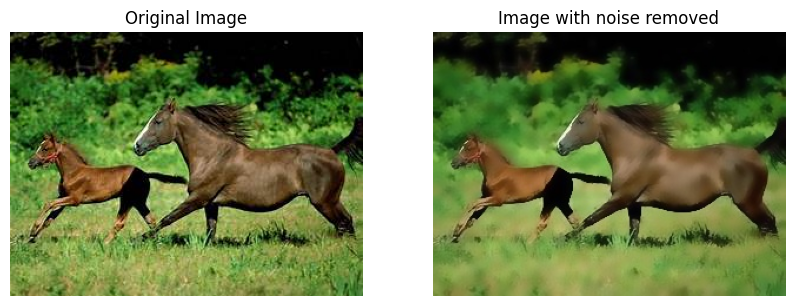

In [ ]:
img_path = "/content/10Animals/horse/OIP--7-usponNbvCN-VhqThI1gHaFj.jpeg"

fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(1,2,1)
img = Image.open(img_path)
img = np.asarray(img)
plt.imshow(img)
plt.axis("off")
plt.title("Original Image")

ax = fig.add_subplot(1,2,2)
filtered_img = cv2.bilateralFilter(img, 10, 105, 125)
filtered_img = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2RGB)
cv2.imwrite("/content/temp.jpg", filtered_img)
filtered_img = mpimg.imread('/content/temp.jpg')
plt.imshow(filtered_img)
plt.axis("off")
plt.title("Image with noise removed")

###### edge detection

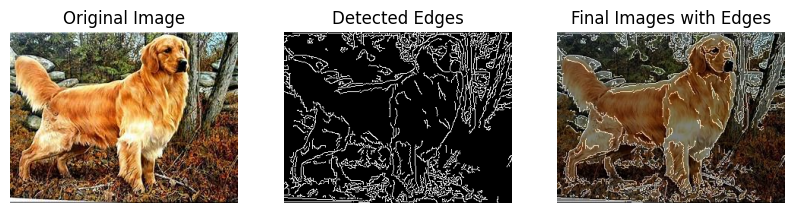

In [ ]:
img_path = "/content/10Animals/dog/OIP-0tMAa3ZV-BaGgW2DRBpVSAHaFj.jpeg"

# /content/10Animals/horse/OIP-8VKl5RwEOjsBOP2f8EE0IAHaE8.jpeg

fig = plt.figure(figsize=(10,6))

ax = fig.add_subplot(1,3,1)
img = Image.open(img_path)
img = np.asarray(img)
# rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert image to RGB as OpenCV reads images in BGR format
plt.title("Original Image")
plt.axis("off")
plt.imshow(img)

ax = fig.add_subplot(1,3,2)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
filtered_img = cv2.bilateralFilter(gray_img, 10, 105, 125) #bi-lateral filtering to remove noise while retaining edges
higher_threshold, _ = cv2.threshold(filtered_img, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU) # computing the maximal inter-class threshold
lower_threshold = higher_threshold * 0.5 # obtaining the lower threshold
edges = cv2.Canny(filtered_img, threshold1=lower_threshold, threshold2=higher_threshold) # obtaining the edges
plt.title("Detected Edges")
plt.axis("off")
plt.imshow(edges, cmap='gray')

ax = fig.add_subplot(1,3,3)
rgb_edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB) # convert edges to rgb for super-imposition with original RGB image
final_img = cv2.addWeighted(img, 0.5, rgb_edges, 0.5, 0.0) # superimposing original images with detected edges
plt.title("Final Images with Edges")
plt.axis("off")
plt.imshow(final_img)

###  data loading and augmentation

In [ ]:
class CustomTransform(object):
  def __init__(self, sigma_color=105, sigma_space=125):
    self.sigma_color = sigma_color
    self.sigma_space = sigma_space

  def __call__(self, img):

    img = np.asarray(img)

    filtered_img = cv2.bilateralFilter(img, 10, self.sigma_color, self.sigma_space)
    filtered_img = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2GRAY) # convert filtered image to grayscale

    higher_threshold, _ = cv2.threshold(filtered_img, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU) # computing the maximal inter-class threshold
    lower_threshold = higher_threshold * 0.5 # obtaining the lower threshold
    edges = cv2.Canny(filtered_img, threshold1=lower_threshold, threshold2=higher_threshold) # obtaining the edges

    rgb_edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB) # convert edges to rgb for super-imposition with original RGB image
    final_img = cv2.addWeighted(img, 0.6, rgb_edges, 0.4, 0.0) # superimposing original images with detected edges

    final_img = Image.fromarray(np.uint8(rgb_edges)).convert('RGB')

    return final_img


train_set_transformations = Compose([
    CustomTransform(),
    Resize(size=(224,224)),
    # RandomHorizontalFlip(),
    # RandomVerticalFlip(),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


validation_set_transformations = Compose([
    Resize(size=(224,224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = ImageFolder(root="/content/FinalImages/train", transform=train_set_transformations)

temp_test_dataset = ImageFolder(root="/content/FinalImages/test", transform=validation_set_transformations)

validation_dataset, test_dataset = random_split(temp_test_dataset, [0.5, 0.5])

train_dataloader = DataLoader(dataset=train_dataset, batch_size=128, shuffle=True, pin_memory=True, num_workers=2)

validation_dataloader = DataLoader(dataset=validation_dataset, batch_size=128, shuffle=True, pin_memory=True, num_workers=2)

test_dataloader = DataLoader(dataset=test_dataset, batch_size=128, shuffle=True, pin_memory=True, num_workers=2)

##### viewing images

In [ ]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(50, 50))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

###### raw images

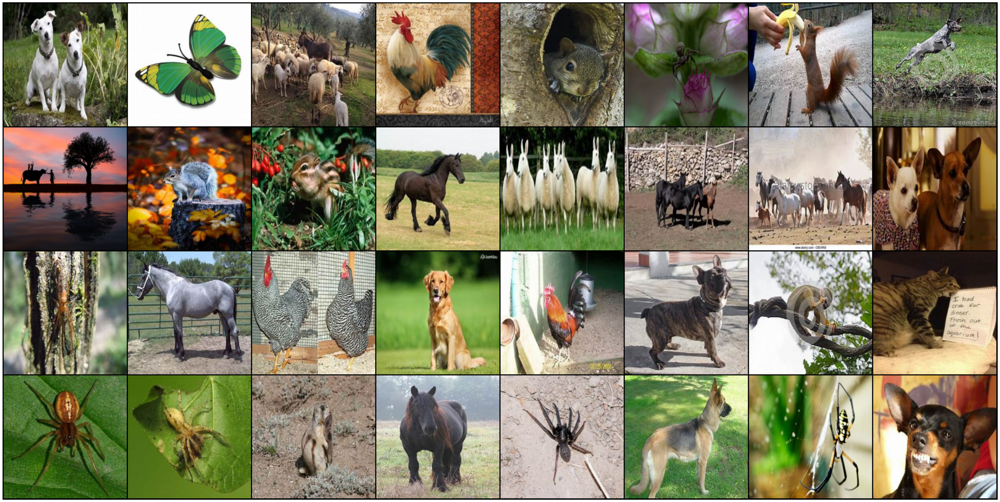

In [ ]:
basic_transform = Compose([
    Resize(size=(224,224)),
    ToTensor()])

data_without_transform = ImageFolder(root="/content/FinalImages/train", transform=basic_transform)

sample_dataloader = DataLoader(dataset=data_without_transform, batch_size=32, shuffle=True)

raw_images, raw_labels = next(iter(sample_dataloader))

raw_grid = make_grid(raw_images)

show(raw_grid)

###### processed images

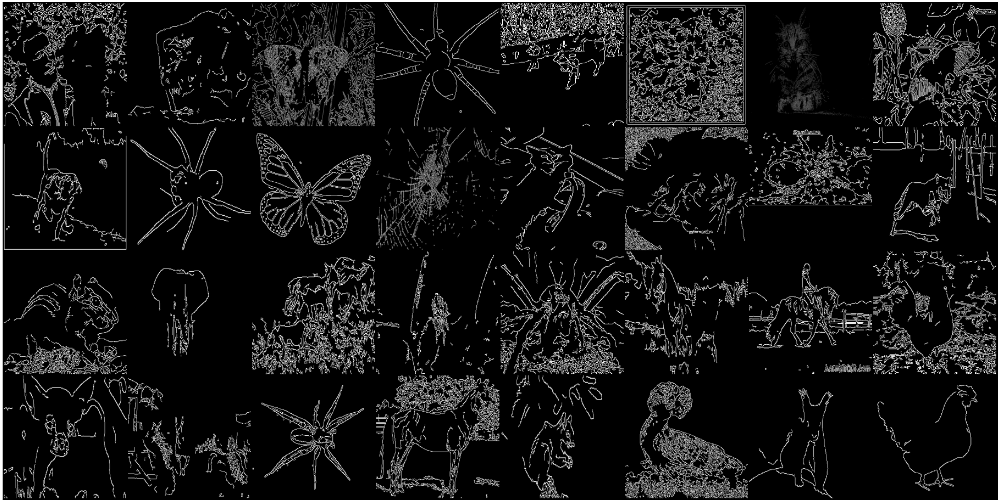

In [ ]:
image, label = next(iter(train_dataloader))

grid = make_grid(image)

plt.rcParams["savefig.bbox"] = 'tight'

show(grid)

### training

In [ ]:
epochs = 10

loss_function = torch.nn.CrossEntropyLoss()

resnet_50 = resnet50(weights="DEFAULT")
vit_L16 = vit_l_16(weights="DEFAULT")
wide_resnet = wide_resnet101_2(weights="DEFAULT")
swinB = swin_b(weights="DEFAULT")

MODELS = [resnet_50, vit_L16, wide_resnet, swinB]
MODEL_NAMES = ["resnet_50", "vit_L16", "wide_resnet", "swinB"]

records = {"epochs": [],
           "train_accuracies": [],
           "train_losses": [],
           "validation_accuracies": [],
           "validation_losses": []}

model_records = {}

torch.manual_seed(777)

for model_name, model in zip(MODEL_NAMES, MODELS):

  if model_name == "resnet_50" or model_name == "wide_resnet":
    for name, params in model.named_parameters():
      if params.requires_grad and "fc" not in name:
        params.requires_grad=False
    model.fc = torch.nn.Linear(in_features=2048, out_features=10)
    model = model.to(device)
  elif model_name == "swinB":
    for name, params in model.named_parameters():
      if params.requires_grad and "head" not in name:
        params.requires_grad=False
    model.head = torch.nn.Linear(in_features=1024, out_features=10)
    model = model.to(device)
  else:
    for name, params in model.named_parameters():
      if params.requires_grad and "heads" not in name:
        params.requires_grad=False
    model.heads = torch.nn.Linear(in_features=1024, out_features=10)
    model = model.to(device)


  optimizer = torch.optim.Adam(model.parameters())

  for i in range(1, epochs + 1):

    train_loss = 0.0
    train_accuracy = 0

    validation_loss = 0.0
    validation_accuracy = 0

    total_train_images = 0
    total_validation_images = 0

    model.train()

    for train_images, train_labels in train_dataloader:
      train_images = train_images.to(device)
      train_labels = train_labels.to(device)

      train_prediction = model(train_images)

      total_train_images += train_labels.shape[0]

      loss = loss_function(train_prediction, train_labels)

      train_loss += loss.item()

      optimizer.zero_grad()

      loss.backward()

      optimizer.step()

      _, index = torch.max(train_prediction, dim=1)

      train_accuracy += int((index == train_labels).sum())


    model.eval()

    for validation_images, validation_labels in validation_dataloader:

      with torch.no_grad():
        validation_images = validation_images.to(device)
        validation_labels = validation_labels.to(device)

        test_prediction = model(validation_images)

        total_validation_images += validation_labels.shape[0]

        loss = loss_function(test_prediction, validation_labels)

        validation_loss += loss.item()

        _, index = torch.max(test_prediction, dim=1)

        validation_accuracy += int((index == validation_labels).sum())

    print(f"{model_name} -  Epoch {i}: Training Accuracy: {train_accuracy/total_train_images} and Validation Accuracy: {validation_accuracy/total_validation_images}")
    print(f"{model_name} -  Epoch {i}: Training Loss: {train_loss/len(train_dataloader)} and Validation Loss: {validation_loss/len(validation_dataloader)}")
    print()

    records["epochs"].append(i)
    records["train_accuracies"].append(train_accuracy/total_train_images)
    records["train_losses"].append(train_loss/len(train_dataloader))
    records["validation_accuracies"].append(validation_accuracy/total_validation_images)
    records["validation_losses"].append(validation_loss/len(validation_dataloader))

    model_records[model_name] = records

  torch.save(model.state_dict(), f'/content/drive/MyDrive/Unprocessed_Images/{model_name}_model.pt')
  print("  -+*  "*15)
  print()


resnet_50 -  Epoch 1: Training Accuracy: 0.48761159115863845 and Validation Accuracy: 0.17813455657492355
resnet_50 -  Epoch 1: Training Loss: 1.5755177212924492 and Validation Loss: 935.4486607142857

resnet_50 -  Epoch 2: Training Accuracy: 0.5985105265670502 and Validation Accuracy: 0.11467889908256881
resnet_50 -  Epoch 2: Training Loss: 1.2354773991718524 and Validation Loss: 1494.879638671875

resnet_50 -  Epoch 3: Training Accuracy: 0.6367498925860505 and Validation Accuracy: 0.07186544342507645
resnet_50 -  Epoch 3: Training Loss: 1.1246697531967629 and Validation Loss: 1862.4008149646577

resnet_50 -  Epoch 4: Training Accuracy: 0.6548431756337423 and Validation Accuracy: 0.06116207951070336
resnet_50 -  Epoch 4: Training Loss: 1.0608971943942511 and Validation Loss: 2160.095482235863

resnet_50 -  Epoch 5: Training Accuracy: 0.6712178354895689 and Validation Accuracy: 0.06230886850152905
resnet_50 -  Epoch 5: Training Loss: 1.0148735733293905 and Validation Loss: 2827.0344935

### plot metrics

In [ ]:
for model_name in MODEL_NAMES:
  record = model_records[model_name]
  epochs = record['epochs']
  train_accuracies = record['train_accuracies']
  train_losses = record['train_losses']
  validation_accuracies = record['validation_accuracies']
  validation_losses = record['validation_losses']

  plt.figure(figsize=(10, 5))

  # Plot accuracy
  plt.subplot(1, 2, 1)
  plt.plot(epochs, train_accuracies, label='train accuracy')
  plt.plot(epochs, validation_accuracies, label='validation accuracy')
  plt.title(f'accuracy plots for {model_name} model')
  plt.xlabel('epochs')
  plt.xlim(1, 4, 1)
  plt.ylabel('accuracies')
  plt.legend()

  # Plot loss
  plt.subplot(1, 2, 2)
  plt.plot(epochs, train_losses, label='train loss')
  plt.plot(epochs, validation_losses, label='validation loss')
  plt.title(f'loss plots for {model_name} model')
  plt.xlabel('epochs')
  plt.xlim(1, 4, 1)
  plt.ylabel('losses')
  plt.legend()

  # plt.show()

  # If you want to save the plot for each model
  plt.savefig(f"/content/drive/MyDrive/Unprocessed_Images/{model_name}_plot.jpg")
  plt.clf()

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

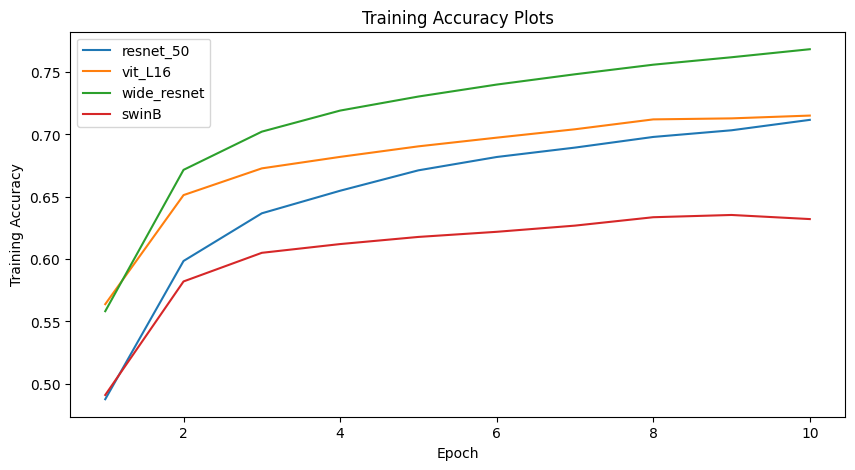

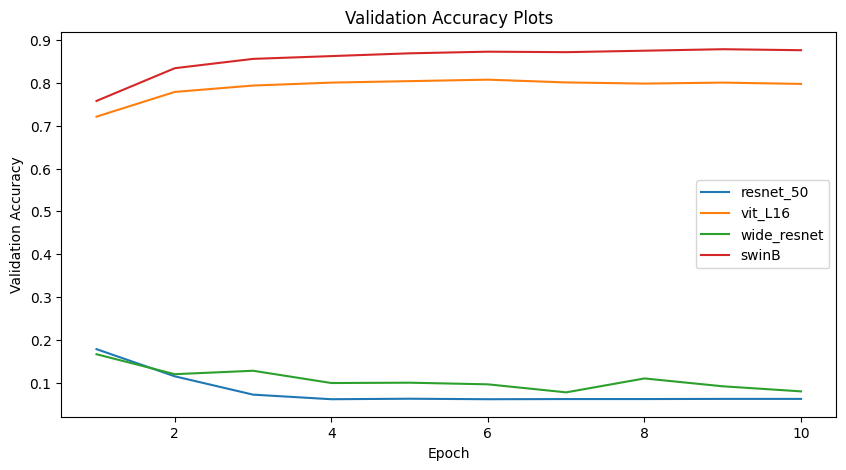

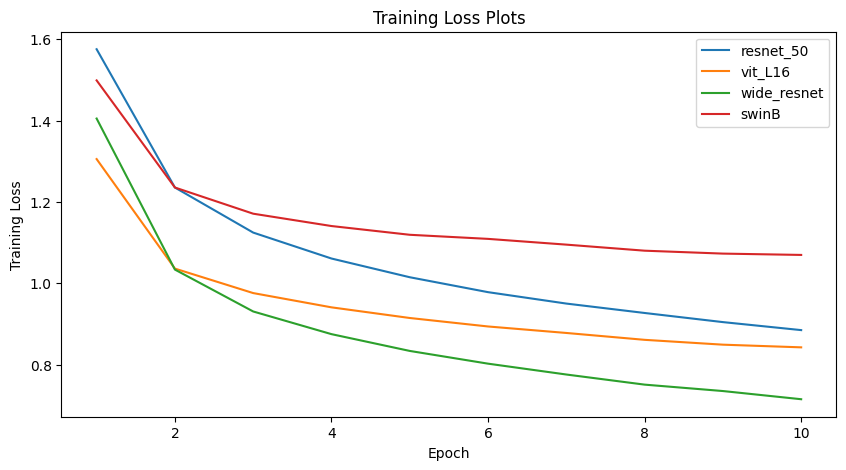

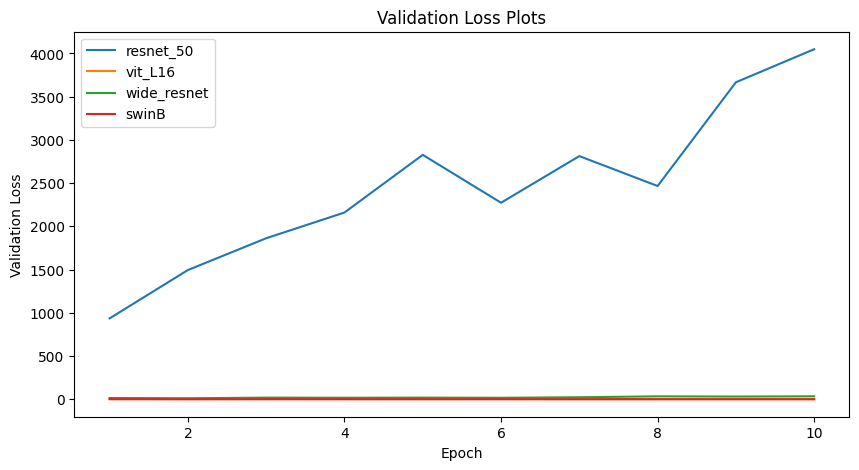

In [ ]:
# Initialize empty lists to store data across models
train_accuracies = []
train_losses = []
validation_accuracies = []
validation_losses = []

for model_name in MODEL_NAMES:
  # Assuming model_records is a dictionary with model names as keys
  record = model_records[model_name]
  epochs = record['epochs']

  train_accuracies.append(record['train_accuracies'])
  train_losses.append(record['train_losses'])
  validation_accuracies.append(record['validation_accuracies'])
  validation_losses.append(record['validation_losses'])

# Plot Training Accuracies
plt.figure(figsize=(10, 5))
for name, accuracy in zip(MODEL_NAMES, train_accuracies):
  plt.plot(epochs, accuracy, label=f'{name}')
plt.title('Training Accuracy Plots')
plt.xlabel('Epoch')
plt.ylabel('Training Accuracy')
plt.legend()
plt.savefig(f"/content/drive/MyDrive/Unprocessed_Images/training_accuracies.jpg")

# Plot Validation Accuracies
plt.figure(figsize=(10, 5))
for name, accuracy in zip(MODEL_NAMES, validation_accuracies):
  plt.plot(epochs, accuracy, label=f'{name}')
plt.title('Validation Accuracy Plots')
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.savefig(f"/content/drive/MyDrive/Unprocessed_Images/validation_accuracies.jpg")

# Plot Training Losses
plt.figure(figsize=(10, 5))
for name, loss in zip(MODEL_NAMES, train_losses):
  plt.plot(epochs, loss, label=f'{name}')
plt.title('Training Loss Plots')
plt.xlabel('Epoch')
plt.ylabel('Training Loss')
plt.legend()
plt.savefig(f"/content/drive/MyDrive/Unprocessed_Images/training_losses.jpg")

# Plot Validation Losses
plt.figure(figsize=(10, 5))
for name, loss in zip(MODEL_NAMES, validation_losses):
  plt.plot(epochs, loss, label=f'{name}')
plt.title('Validation Loss Plots')
plt.xlabel('Epoch')
plt.ylabel('Validation Loss')
plt.legend()
plt.savefig(f"/content/drive/MyDrive/Unprocessed_Images/validation_losses.jpg")

plt.show()


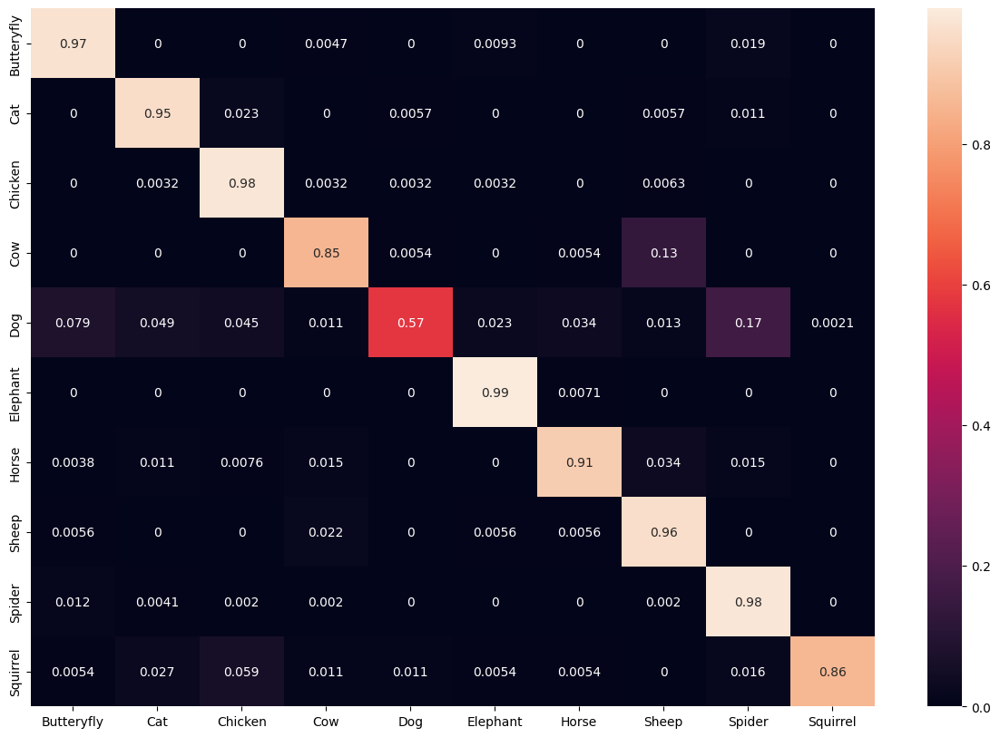

In [ ]:
net = swin_b(weights="DEFAULT")

for name, params in net.named_parameters():
  if params.requires_grad and "head" not in name:
    params.requires_grad=False
  net.head = torch.nn.Linear(in_features=1024, out_features=10)

net.load_state_dict(torch.load("/content/drive/MyDrive/Unprocessed_Images/swinB_model.pt"))
net = net.to(device)

net.eval()

y_pred = []
y_true = []


for inputs, labels in test_dataloader:
  inputs = inputs.to(device)
  labels = labels.to(device)

  output = net(inputs)

  output = (torch.max(output, 1)[1]).data.cpu().numpy()
  y_pred.extend(output)

  labels = labels.data.cpu().numpy()
  y_true.extend(labels)


classes = ('Butteryfly', 'Cat', 'Chicken', 'Cow', 'Dog', 'Elephant', 'Horse', 'Sheep', 'Spider', 'Squirrel')


cf_matrix = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [i for i in classes],
                     columns = [i for i in classes])

plt.figure(figsize = (15, 10))
sn.heatmap(df_cm, annot=True)

plt.savefig('/content/drive/MyDrive/Unprocessed_Images/confusion_matrix.jpg')

### model explainability

In [ ]:
classes = ('Butteryfly', 'Cat', 'Chicken', 'Cow', 'Dog', 'Elephant', 'Horse', 'Sheep', 'Spider', 'Squirrel')

horse = "/content/10Animals/horse/OIP--7-usponNbvCN-VhqThI1gHaFj.jpeg"
elephant = "/content/10Animals/elephant/OIP-20UjAMMfwS_u6OKhj03SAAHaIQ.jpeg"
sheep = "/content/10Animals/sheep/OIP-0SdQZ5k_7HA2qlBT9scaogHaFj.jpeg"
spider = "/content/10Animals/spider/OIP--86L_FFTa-JtV4834BxTYgHaFj.jpeg"
cow = "/content/10Animals/cow/OIP---lAIbDlHKmejDpqrXq6vAAAAA.jpeg"
butterfly = "/content/10Animals/butterfly/OIP--ohLNsXa1I98upPDakBeBAHaE6.jpeg"

img = cv2.imread(butterfly)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (224, 224))

img = np.float32(img) / 255

wide_resnet = wide_resnet101_2(weights="DEFAULT")
for name, params in wide_resnet.named_parameters():
  # change the classification layer to suit 10 classes
  wide_resnet.fc = torch.nn.Linear(in_features=2048, out_features=10)

# loading the finetuned model.
wide_resnet.load_state_dict(torch.load("/content/drive/MyDrive/Processed_Images/wide_resnet_model.pt"))
wide_resnet = wide_resnet.to(device)

for name, param in wide_resnet.named_parameters():
  param.requires_grad = True

wide_resnet.eval() # turning of dropout layers during model inference

input_tensor = preprocess_image(img)

# obtaining the layer before the clasification layer
target_layers = [wide_resnet.layer4[-1]]

cam = AblationCAM(wide_resnet, target_layers)
grayscale_cam = cam(input_tensor) # generating the class activation map for input image.

grayscale_cam = grayscale_cam[0, :]
cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)

images = np.hstack((np.uint8(255 * img), cam_image))
finalImage = Image.fromarray(images)
finalImage.save("/content/drive/MyDrive/Processed_Images/butterfly_cam.jpeg")

100%|██████████| 64/64 [00:18<00:00,  3.47it/s]
